# **Import Libraries**

In [ ]:
!pip install emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 12.1 MB/s eta 0:00:00


In [ ]:
import gdown
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
import emoji
import tensorflow as tf

In [ ]:
!pip install emoji

In [ ]:
# Download required resources
nltk.download("stopwords")
nltk.download("punkt")
nltk.download("punkt_tab")
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

# **Download File**

In [ ]:
file_id = "1D5XjGR3F9QsVf6jCvAE6Ck8jWFup-qGI"
url = f"https://drive.google.com/uc?id={file_id}"
file_name = "crypto_currency_sentiment_dataset.csv"
gdown.download(url, file_name, quiet=False)
print("\nFile downloaded successfully!")

Downloading...
From: https://drive.google.com/uc?id=1D5XjGR3F9QsVf6jCvAE6Ck8jWFup-qGI
To: /content/crypto_currency_sentiment_dataset.csv
100%|██████████| 205k/205k [00:00<00:00, 84.9MB/s]


File downloaded successfully!


# **Read File**

In [ ]:
data = pd.read_csv(file_name)

In [ ]:
data.head(5)

,user_id,Comment,Sentiment,Reddit URL
0,XYNN2Y4VCF3G,"I bought 2200 at the ico, at 0.50$ per coin. H...",Positive,https://www.reddit.com/r/Avax/comments/uzggar/...
1,DR6XNZMT9KRH,"Harmony one , algorand , Cardano, solana , vec...",Positive,https://www.reddit.com/r/CryptoCurrency/commen...
2,9FCQGMYD4A42,"Honestly, after reading this post and many of ...",Negative,https://www.reddit.com/r/CryptoCurrency/commen...
3,QEZAEMV2WF9D,In bear market is where money is made. I Will ...,Positive,https://www.reddit.com/r/CryptoCurrency/commen...
4,Z7J7W3XCP4XC,Funny how people think Bitcoin's risk is compa...,Negative,https://www.reddit.com/r/investing/comments/um...


# **Data Wrangling & EDA**

In [ ]:
# Number of Records
data.shape

(562, 4)

In [ ]:
# drop unwanted columns
data.drop(columns=['user_id','Reddit URL'], inplace=True)

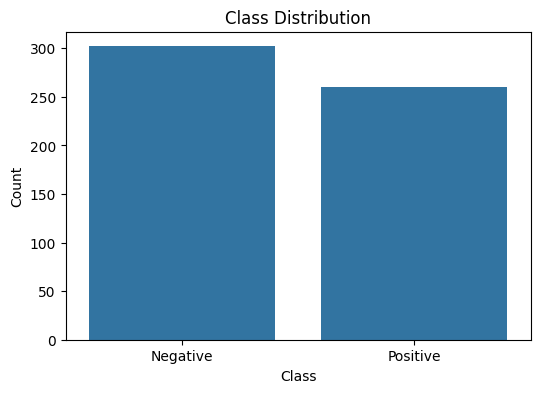

In [ ]:
# Imbalance Balance Check
class_counts = data['Sentiment'].value_counts()
plt.figure(figsize=(6,4))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Class Distribution")
plt.xticks(ticks=[0, 1], labels=["Negative", "Positive"])  # Adjust labels if needed
plt.show()

In [ ]:
# Missing Value Check
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562 entries, 0 to 561
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Comment    562 non-null    object
 1   Sentiment  562 non-null    object
dtypes: object(2)
memory usage: 8.9+ KB


In [ ]:
# Duplicate values check
data.duplicated().sum()

10

In [ ]:
data[data.duplicated()]

,Comment,Sentiment
149,"If going long term, BTC and ETH are the coins ...",Positive
204,It's going on sale! I'm gonna get so fat on bi...,Positive
288,The record we didn't need.,Negative
416,I'm super bullish on dot. My best hold imho. L...,Positive
460,There has been three fraudulent scam coins fro...,Negative
487,BTC should be in everyone’s Portfolio,Positive
500,good time to accumulate,Positive
515,Not gonna trust this horrific guy and never go...,Negative
545,"Good, cheaper Bitcoin",Positive
553,Stay away from LUNA Scam 2.0,Negative


In [ ]:
# Remove Duplicates
data.drop_duplicates(inplace = True)

In [ ]:
data.shape

(552, 2)

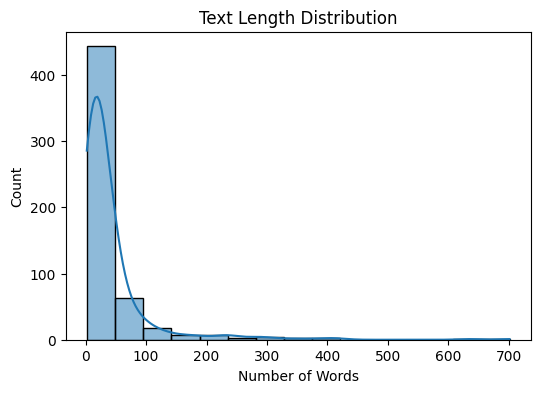

In [ ]:
# Text Length Analysis
data['text_length'] = data['Comment'].apply(lambda x: len(str(x).split()))
# Plot distribution
plt.figure(figsize=(6,4))
sns.histplot(data['text_length'], bins=15, kde=True)
plt.title("Text Length Distribution")
plt.xlabel("Number of Words")
plt.ylabel("Count")
plt.show()

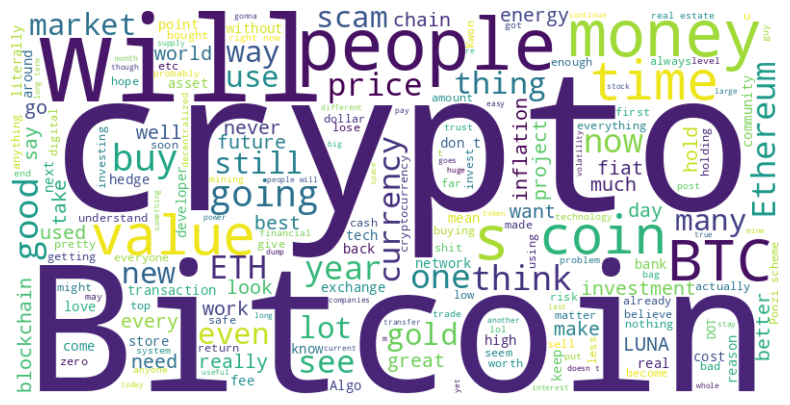

In [ ]:
# Word Cloud on frequent words
text = " ".join(data['Comment'])  # Combine all text
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)

# Plot word cloud
plt.figure(figsize=(10,5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

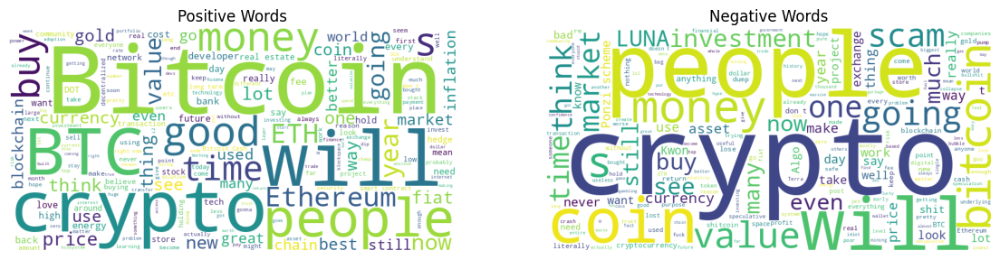

In [ ]:
# Separate text by class
positive_text = " ".join(data[data['Sentiment'] == "Positive"]['Comment'])
negative_text = " ".join(data[data['Sentiment'] == "Negative"]['Comment'])

# Generate WordCloud for Positive and Negative
fig, ax = plt.subplots(1, 2, figsize=(14,6))

ax[0].imshow(WordCloud(width=800, height=400, background_color="white").generate(positive_text))
ax[0].set_title("Positive Words")
ax[0].axis("off")

ax[1].imshow(WordCloud(width=800, height=400, background_color="white").generate(negative_text))
ax[1].set_title("Negative Words")
ax[1].axis("off")

plt.show()

# **Preprocessing**

In [ ]:
class TextPreprocessor:
  def __init__(self, max_features=1000):
    self.stop_words = set(stopwords.words("english"))
    self.stemmer = PorterStemmer()
    self.lammetizer = WordNetLemmatizer()
    self.custom_stopwords = (
    # Verbel pauses
    "umm", "uh", "oh", "ah", "eh", "hmm", "yeah", "yep", "nope", "okay", "ok",
    "alright", "sure", "y'know", "like", "kinda", "sorta", "anyway", "well",
    "basically", "literally", "actually", "totally", "honestly", "seriously",
    "maybe", "probably", "perhaps", "just", "mean", "right",
    # Slangs
    "lmao", "lmfao", "rofl", "brb", "btw", "tbh", "idk", "omg", "omfg",
    "wtf", "wth", "smh", "ikr", "nvm", "fyi", "afaik", "imho", "imo", "ftw",
    "gg", "np", "wb", "yw", "hf", "ggwp", "hmu", "dm", "pm",
    "sup", "wyd", "wbu", "jk", "kek", "lel", "hehe", "haha", "xD", ":-)",
    ":-(", ":P", ";)", "<3", ":')", "._.",
    # Expressions, Reactions & Onomatopoeia
    "haha", "hehe", "hihi", "hoho", "lolol", "lols", "pfft", "tsk", "ugh", "meh",
    "ew", "huh", "whoa", "woah", "ouch", "oops", "woot", "yay", "boo", "grr",
    "argh", "eep", "huzzah", "yikes", "dang", "darn",
    # Non-Informative Words in Casual Messaging
    "whatever", "thingy", "stuff", "thing", "something", "nothing", "everything",
    "everyone", "somebody", "anybody", "nobody", "somehow", "anyhow", "maybe",
    "probably", "sorta", "kinda", "dunno", "nah", "yea", "welp"
    #special Keywords
    "bitcoin","btc","ethereum",'blockchain','luna')
    self.vectorizer = TfidfVectorizer(max_features=max_features, ngram_range=(1,2))
    #self.vectorizer = CountVectorizer(ngram_range=(1,2))
    #self.vectorizer = SentenceTransformer("all-MiniLM-L6-v2")

  def clean_text(self, sentances):
    clean = []
    for sentance in sentances:
      sentance = sentance.lower() # to lowecase
      sentance = sentance.translate(str.maketrans("", "", string.punctuation))  # Remove punctuation
      sentance = re.sub(r"\d+", "", sentance)  # Remove numbers
      sentance = re.sub(r'[^\w\s]', "", sentance)  # Remove symbols
      sentence = emoji.demojize(sentance)
      tokens = word_tokenize(sentance)  # Tokenization
      tokens = [word for word in tokens if word not in self.stop_words and word not in self.custom_stopwords]  # Remove stopwords
      #tokens = [self.stemmer.stem(word) for word in tokens]  # Stemming
      tokens = [self.lammetizer.lemmatize(word) for word in tokens]  # Lemmatization
      sentance = " ".join(tokens)
      clean.append(sentance)
    return clean

  def text_to_vector(self,text):
    doc = self.vectorizer(text)
    return doc.vector  # Get the sentence embedding

  def fit_transform_tfidf(self, sentances):
    #return sentances.apply(lambda x: self.vectorizer.encode(x))
    return self.vectorizer.fit_transform(sentances)

  def transform_tfidf(self, sentances):
    #return sentances.apply(lambda x: self.vectorizer.encode(x))
    return self.vectorizer.transform(sentances)

In [ ]:
preprocessor = TextPreprocessor()
data['CleanText'] = preprocessor.clean_text(data['Comment'])

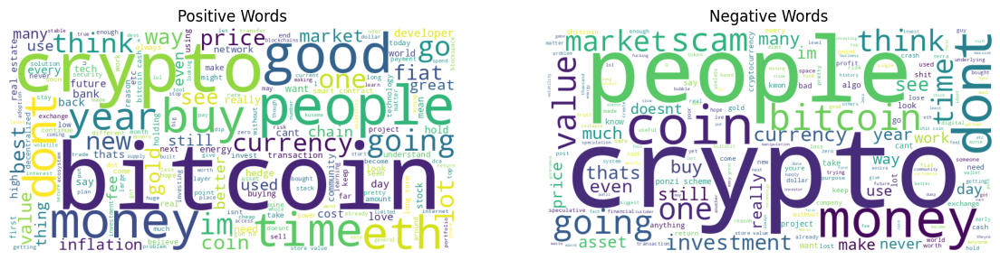

In [ ]:
# Separate text by class
positive_text = " ".join(data[data['Sentiment'] == "Positive"]['CleanText'])
negative_text = " ".join(data[data['Sentiment'] == "Negative"]['CleanText'])

# Generate WordCloud for Positive and Negative
fig, ax = plt.subplots(1, 2, figsize=(14,6))

ax[0].imshow(WordCloud(width=800, height=400, background_color="white").generate(positive_text))
ax[0].set_title("Positive Words")
ax[0].axis("off")

ax[1].imshow(WordCloud(width=800, height=400, background_color="white").generate(negative_text))
ax[1].set_title("Negative Words")
ax[1].axis("off")

plt.show()

In [ ]:
test = preprocessor.fit_transform_tfidf(data['CleanText'])

In [ ]:
output = {"Positive":1, "Negative":0}

In [ ]:
data['Sentiment_value'] = data['Sentiment'].map(output)

# **Train Text Split**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data['CleanText'], data['Sentiment_value'], test_size=0.2, random_state=42)

# **Conventional Models**

In [ ]:
X_train = preprocessor.fit_transform_tfidf(X_train)
X_test = preprocessor.transform_tfidf(X_test)

In [ ]:
# 🔹 Models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(kernel="linear",probability=True)
}


In [ ]:
from sklearn.model_selection import cross_val_score
# 🔹 Training and Evaluation
for name, model in models.items():
    model.fit(X_train, y_train)  # Train model
    y_pred = model.predict(X_test)  # Predict on test set

    # Print results
    print(f"\n🔹 {name} Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(classification_report(y_test, y_pred))


🔹 Logistic Regression Accuracy: 0.7117
              precision    recall  f1-score   support

           0       0.79      0.52      0.63        52
           1       0.68      0.88      0.76        59

    accuracy                           0.71       111
   macro avg       0.73      0.70      0.70       111
weighted avg       0.73      0.71      0.70       111


🔹 SVM Accuracy: 0.7117
              precision    recall  f1-score   support

           0       0.74      0.60      0.66        52
           1       0.70      0.81      0.75        59

    accuracy                           0.71       111
   macro avg       0.72      0.70      0.70       111
weighted avg       0.72      0.71      0.71       111



In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np
enc_model = SentenceTransformer('all-mpnet-base-v2')
encoded = enc_model.encode(list(data['Comment'].apply(str.lower)), batch_size=64)

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

model = Sequential([
    Dense(64, activation='relu', input_shape=(768,)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

# Compile Model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train Model

model.fit(encoded, data['Sentiment_value'], epochs=50, batch_size=8, validation_split=0.2, callbacks=[early_stop,tensorboard_callback], shuffle=True)

Epoch 1/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - accuracy: 0.5285 - loss: 0.6887 - val_accuracy: 0.6396 - val_loss: 0.6534
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8085 - loss: 0.5996 - val_accuracy: 0.8108 - val_loss: 0.4728
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8571 - loss: 0.4070 - val_accuracy: 0.8559 - val_loss: 0.3334
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8949 - loss: 0.2677 - val_accuracy: 0.8739 - val_loss: 0.2934
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9315 - loss: 0.1900 - val_accuracy: 0.8739 - val_loss: 0.2624
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9480 - loss: 0.1802 - val_accuracy: 0.8739 - val_loss: 0.2645
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9413 - loss: 0.1941 - val_accuracy: 0.8829 - val_loss: 0.2167
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9714 - loss: 0.1264 - val_accuracy: 0.8919 - val_loss

In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 8153), started 0:09:11 ago. (Use '!kill 8153' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
output = model.predict(enc_model.encode([
"While decentralization is a core principle of cryptocurrency, the concentration of wealth among early adopters and whales often leads to price manipulation and market instability."]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


In [ ]:
predicted_label = (output >= 0.7).astype(int)

In [ ]:
output

array([[0.27107924]], dtype=float32)

In [ ]:
predicted_label

array([[0]])